# Apply ML algorithms

   1. Linear Regression
   2. Lasso Regression
   3. Decision Tree Regressor
   4. KNN Regressor
   5. RandomForestRegressor
   6. Xgboost Regressor
   7. Huperparameter Tuning
   8. ANN- Artificial Neural Network



In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [18]:
df =pd.read_csv('Data/Real-Data/Combine.csv')
df

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833
...,...,...,...,...,...,...,...,...,...
1088,18.1,24.0,11.2,1015.4,56.0,1.8,15.9,25.9,288.416667
1089,17.8,25.0,10.7,1015.8,54.0,2.3,9.4,22.2,256.833333
1090,13.9,24.5,11.4,1015.0,95.0,0.6,8.7,14.8,169.000000
1091,16.3,23.0,9.8,1016.9,78.0,1.1,7.4,16.5,186.041667


In [19]:
df.isnull().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

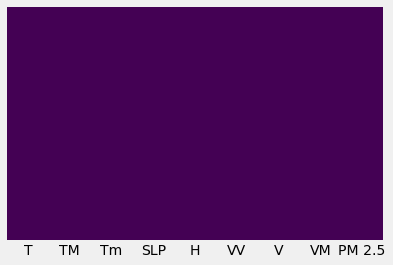

In [20]:
sns.heatmap(df.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [21]:
df=df.dropna()

In [22]:
df2=df.copy()

In [23]:
#independant feature
X=df2.iloc[:,:-1]

#dependant fearture
y=df2.iloc[:,-1]

In [24]:
X.isnull().sum()

T      0
TM     0
Tm     0
SLP    0
H      0
VV     0
V      0
VM     0
dtype: int64

In [25]:
y.isnull().sum()

0

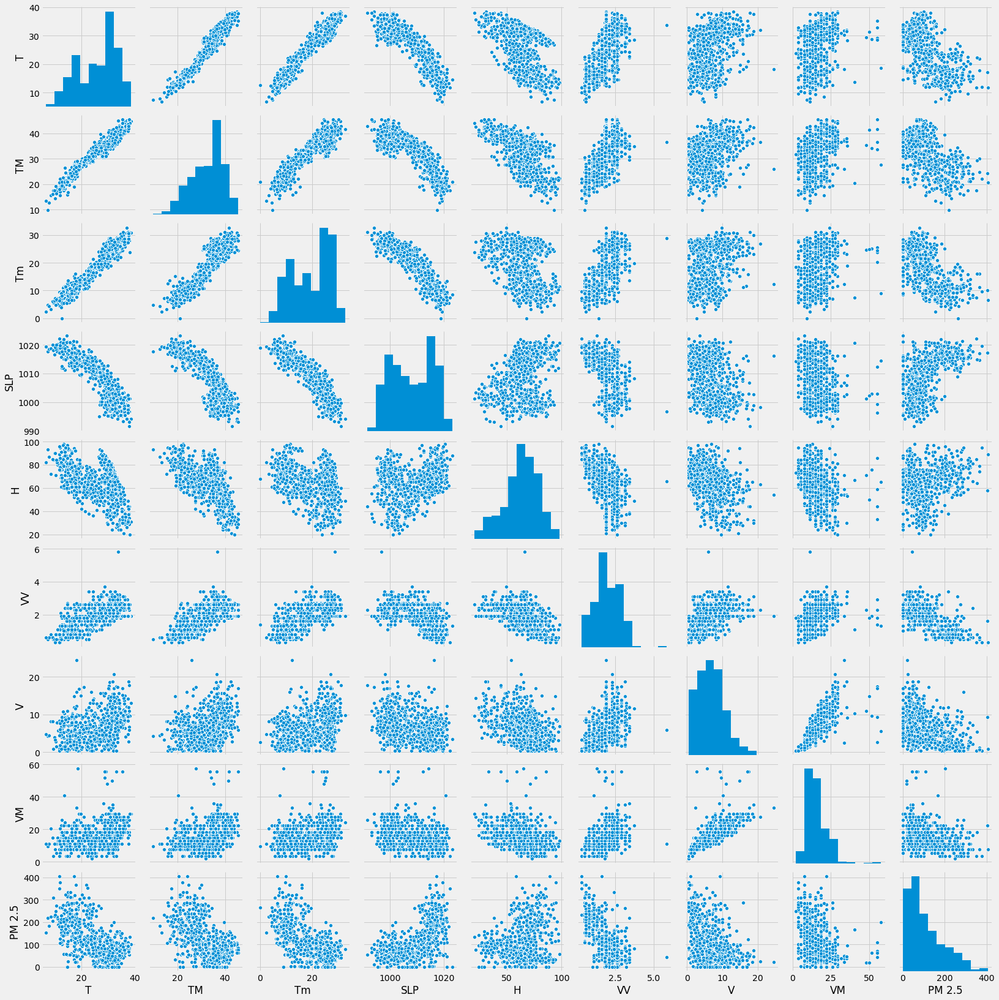

In [26]:
sns.pairplot(df)

In [27]:
df2.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


# Correlation Matrix with Heatmap

Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.


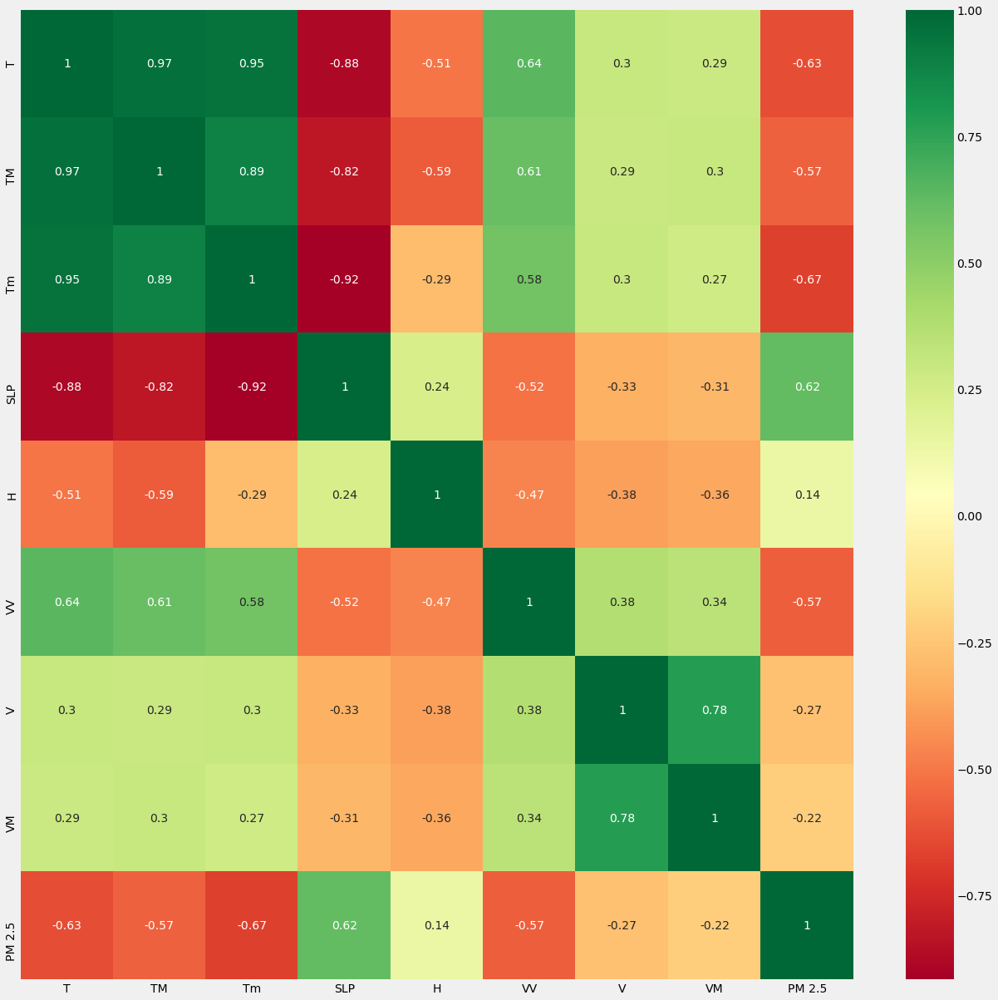

In [28]:
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")


In [29]:
#when feature is 0 then ingnore ti bcoz no relation between them
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

# Feature Importance

You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.


In [30]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [31]:
print(model.feature_importances_)

[0.17901097 0.11104118 0.22181049 0.11646296 0.08925348 0.18724971
 0.05132127 0.04384995]


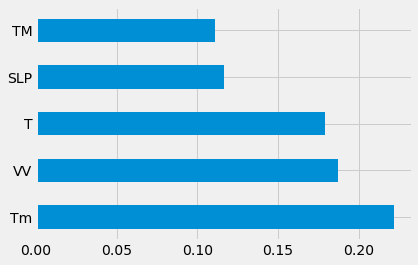

In [32]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

# Decision Tree

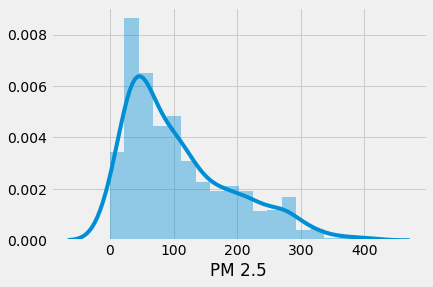

In [33]:
sns.distplot(y)

In [34]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [35]:
from sklearn.tree import DecisionTreeRegressor

In [37]:
dt=DecisionTreeRegressor(criterion='mse')
dt.fit(X_train,y_train)

DecisionTreeRegressor()

In [38]:
#it is overfit
print("Coefficient of determination R^2 <-- on train set: {}".format(dt.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [39]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dt.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.6601559385210725


In [41]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dt,X,y,cv=5)

In [43]:
score.mean()

0.45653227021194515

# Tree Visualization

Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:


In [45]:
#conda install pydotplus
## conda install python-graphviz

from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [46]:
features = list(df2.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [47]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [48]:
dot_data = StringIO()  
export_graphviz(dt, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.949053 to fit



In [49]:
prediction=dt.predict(X_test)

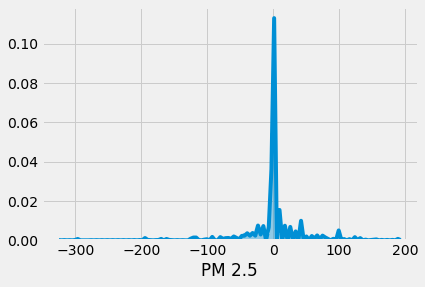

In [50]:
sns.distplot(y_test-prediction)

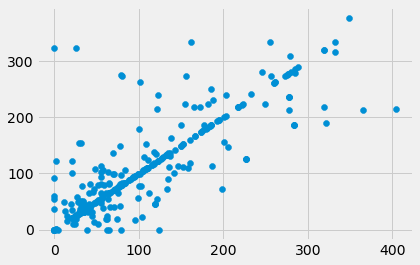

In [51]:
plt.scatter(y_test,prediction)

# Hyper Parameter Tuning

In [66]:
params ={
    'splitter':['best','random'],
    'max_depth':[3,4,5,6,8,10,12,15],
    "min_samples_leaf" : [ 1,2,3,4,5 ],
    'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4],
    'max_features':['auto','log2','sqrt',None],
    'max_leaf_nodes':[None,10,20,30,40,50,60,70]
}


In [67]:
from sklearn.model_selection import GridSearchCV

grid_search =GridSearchCV(dt,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [58]:
def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [68]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
grid_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 2968 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 6552 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 11160 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 16792 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done 23448 tasks      | elapsed:   52.3s
[Parallel(n_jobs=-1)]: Done 31128 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 39832 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 49560 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 60312 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 72088 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 84888 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 98712 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 102400

In [69]:
grid_search.best_params_

{'max_depth': 5,
 'max_features': None,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [70]:
grid_search.best_score_

-3131.6489619178874

In [71]:
predictions=grid_search.predict(X_test)

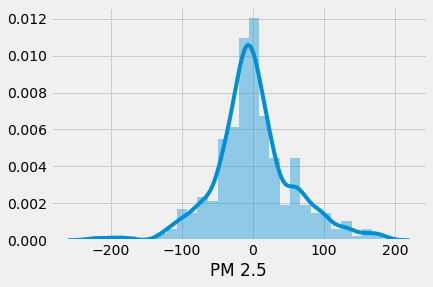

In [72]:
sns.distplot(y_test-predictions)

# Model Evaluation

# Regression Evaluation Metrics¶

Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:
$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

Mean Squared Error (MSE) is the mean of the squared errors:
$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:
$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

   * MAE is the easiest to understand, because it's the average error.
   * MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
   * RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are loss functions, because we want to minimize them.


In [73]:
from sklearn import metrics

In [74]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 23.95942581300813
MSE: 2434.575359819614
RMSE: 49.34141627294066


In [75]:
import pickle

In [77]:
# open a file, where you ant to store the data
file = open('decision_tree.pkl', 'wb')

# dump information to that file
pickle.dump(grid_search, file)